<a href="https://colab.research.google.com/github/Oreniscool/happiness-index/blob/main/happiness_predictor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#initalization and data loading
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

data = pd.read_csv('happiness_report.csv')

data.head()

,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
0,Afghanistan,2008,3.724,7.350,0.451,50.5,0.718,0.164,0.882,0.414,0.258
1,Afghanistan,2009,4.402,7.509,0.552,50.8,0.679,0.187,0.850,0.481,0.237
2,Afghanistan,2010,4.758,7.614,0.539,51.1,0.600,0.118,0.707,0.517,0.275
3,Afghanistan,2011,3.832,7.581,0.521,51.4,0.496,0.160,0.731,0.480,0.267
4,Afghanistan,2012,3.783,7.661,0.521,51.7,0.531,0.234,0.776,0.614,0.268


#### **Member 1: Week 1**(Omkar)

- *Dataset Understanding* (3 hours)
   - Review dataset structure and summarize key characteristics (number of rows, columns, features).
- *Missing Data Handling* (3 hours)
   - Identify missing data patterns and decide how to handle them (fill, drop).

- *Normalization & Encoding* (4 hours)
   - Normalize numeric data (e.g., age) and encode categorical variables (e.g., country, event).
- *Data Splitting* (2 hours)
   - Split data into training and testing sets.

- *Documentation and Code Commenting* (3 hours)
   - Document the steps of preprocessing and write detailed code comments.
- *Collaboration with Member 2* (1 hour)
   - Ensure data is ready for exploration.


In [2]:
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split

# Review dataset structure and summarize key characteristics
num_rows, num_columns = data.shape
columns = data.columns.tolist()
summary = data.describe()

# Display basic structure of the dataset
structure_summary = {
    "Number of rows": num_rows,
    "Number of columns": num_columns,
    "Columns": columns,
    "Summary statistics": summary
}
print("Dataset Structure Summary:")
for key, value in structure_summary.items():
    print(f"{key}: {value}")


Dataset Structure Summary:
Number of rows: 2363
Number of columns: 11
Columns: ['Country name', 'year', 'Life Ladder', 'Log GDP per capita', 'Social support', 'Healthy life expectancy at birth', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 'Positive affect', 'Negative affect']
Summary statistics:               year  Life Ladder  Log GDP per capita  Social support  \
count  2363.000000  2363.000000         2335.000000     2350.000000   
mean   2014.763860     5.483566            9.399671        0.809369   
std       5.059436     1.125522            1.152069        0.121212   
min    2005.000000     1.281000            5.527000        0.228000   
25%    2011.000000     4.647000            8.506500        0.744000   
50%    2015.000000     5.449000            9.503000        0.834500   
75%    2019.000000     6.323500           10.392500        0.904000   
max    2023.000000     8.019000           11.676000        0.987000   

       Healthy life expectancy a

In [3]:
# Identify missing data patterns
missing_data = data.isnull().sum()
missing_data_percentage = (missing_data / len(data)) * 100
missing_data_summary = pd.DataFrame({
    "Missing Values": missing_data,
    "Percentage": missing_data_percentage
}).sort_values(by="Percentage", ascending=False)

print("\nMissing Data Summary:")
print(missing_data_summary)

# Handle missing data
numeric_columns = data.select_dtypes(include=['number']).columns
fill_columns = missing_data_summary[
    (missing_data_summary["Percentage"] < 2) &
    (missing_data_summary.index.isin(numeric_columns))
].index
data[fill_columns] = data[fill_columns].apply(lambda col: col.fillna(col.median()), axis=0)

# Drop rows with missing values in columns with > 2% missing data
drop_columns = missing_data_summary[missing_data_summary["Percentage"] >= 2].index
data = data.dropna(subset=drop_columns)

# Verify if missing values are handled
final_missing_data = data.isnull().sum()
final_missing_data_summary = pd.DataFrame({
    "Missing Values After Handling": final_missing_data,
    "Percentage After Handling": (final_missing_data / len(data)) * 100
}).sort_values(by="Percentage After Handling", ascending=False)

print("\nFinal Missing Data Summary After Handling:")
print(final_missing_data_summary)



Missing Data Summary:
                                  Missing Values  Percentage
Perceptions of corruption                    125    5.289886
Generosity                                    81    3.427846
Healthy life expectancy at birth              63    2.666102
Freedom to make life choices                  36    1.523487
Log GDP per capita                            28    1.184934
Positive affect                               24    1.015658
Negative affect                               16    0.677105
Social support                                13    0.550148
Country name                                   0    0.000000
year                                           0    0.000000
Life Ladder                                    0    0.000000

Final Missing Data Summary After Handling:
                                  Missing Values After Handling  \
Country name                                                  0   
year                                                          0   


In [4]:
# Separate numeric and categorical columns
numeric_columns = data.select_dtypes(include=['int64', 'float64']).drop(columns=['Positive affect', 'Negative affect','year']).columns
categorical_columns = data.select_dtypes(include=['object']).columns

print("\nNumeric columns:", numeric_columns.tolist())
print("Categorical columns:", categorical_columns.tolist())

# Initialize the StandardScaler for normalization
scaler = StandardScaler()

# Normalize numeric columns
normalized_data = data.copy()
normalized_data[numeric_columns] = scaler.fit_transform(data[numeric_columns])


# Split features and target
target_columns = ['Positive affect', 'Negative affect']
# if target_column in normalized_data.columns:
#     X = normalized_data.drop(columns=target_columns)
#     y = normalized_data[target_columns]
# else:
#     # If no specific target column, use all data as features
#     X = normalized_data
#     y = None

# # Split the data into training and testing sets
# if y is not None:
#     X_train, X_test, y_train, y_test = train_test_split(
#         X, y, test_size=0.2, random_state=42
#     )
#     print("\nTraining set shape:", X_train.shape)
#     print("Testing set shape:", X_test.shape)
# else:
#     # If no target variable, split only X
#     X_train, X_test = train_test_split(
#         X, test_size=0.2, random_state=42
#     )
#     print("\nTraining set shape:", X_train.shape)
#     print("Testing set shape:", X_test.shape)

# Save the preprocessed data
normalized_data.to_csv('preprocessed_data.csv', index=False)

# Print summary of transformations
print("\nPreprocessing Summary:")
print("1. Normalized numeric columns using StandardScaler")
print("2. Encoded categorical columns using LabelEncoder")
print("3. Split data into training (80%) and testing (20%) sets")
print("\nNormalized and encoded data shape:", normalized_data.shape)

print("\nNormalized data head:")
normalized_data.head()



Numeric columns: ['Life Ladder', 'Log GDP per capita', 'Social support', 'Healthy life expectancy at birth', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption']
Categorical columns: ['Country name']

Preprocessing Summary:
1. Normalized numeric columns using StandardScaler
2. Encoded categorical columns using LabelEncoder
3. Split data into training (80%) and testing (20%) sets

Normalized and encoded data shape: (2121, 11)

Normalized data head:


,Country name,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
0,Afghanistan,2008,-1.534075,-1.735050,-2.890446,-1.831162,-0.224818,1.014115,0.739800,0.414,0.258
1,Afghanistan,2009,-0.936210,-1.597095,-2.070783,-1.788127,-0.506967,1.156247,0.565624,0.481,0.237
2,Afghanistan,2010,-0.622287,-1.505993,-2.176284,-1.745091,-1.078499,0.729850,-0.212723,0.517,0.275
3,Afghanistan,2011,-1.438840,-1.534625,-2.322363,-1.702055,-1.830896,0.989396,-0.082091,0.480,0.267
4,Afghanistan,2012,-1.482049,-1.465214,-2.322363,-1.659020,-1.577686,1.446692,0.162843,0.614,0.268


## Member 2 Week 1
- *Basic EDA* (3 hours)
   - Compute summary statistics (mean, median, etc.).
- *Basic Visualizations* (3 hours)
   - Generate initial histograms, box plots, and bar graphs to explore distribution.
- *Correlation Analysis* (3 hours)
   - Create a correlation heatmap to find relationships between features.
- *Feature Selection* (4 hours)
   - Identify key features (e.g., age, country, event) based on correlation and dataset analysis.
- *Feature Engineering* (3 hours)
   - Engineer new features (e.g., grouping athletes by age ranges or performance categories).


In [5]:
#Basic EDA
data.describe()

,year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
count,2121.000000,2121.000000,2121.000000,2121.000000,2121.000000,2121.000000,2121.000000,2121.000000,2121.000000,2121.000000
mean,2014.864215,5.463695,9.349736,0.807165,63.264960,0.749075,-0.000105,0.746082,0.653943,0.274662
std,4.984641,1.134302,1.152824,0.123250,6.972604,0.138257,0.161859,0.183766,0.106896,0.085398
min,2005.000000,2.179000,5.527000,0.290000,6.720000,0.258000,-0.340000,0.035000,0.179000,0.094000
25%,2011.000000,4.616000,8.460000,0.738000,58.700000,0.659000,-0.110000,0.689000,0.573000,0.212000
50%,2015.000000,5.425000,9.490000,0.834000,65.040000,0.770000,-0.022000,0.800000,0.664000,0.263000
75%,2019.000000,6.283000,10.310000,0.905000,68.600000,0.859000,0.092000,0.868000,0.740000,0.326000
max,2023.000000,7.971000,11.676000,0.987000,74.600000,0.985000,0.700000,0.983000,0.884000,0.705000


In [6]:
# Ploting trends of positive and negative affect on happiness for each country
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from math import ceil

def analyze_happiness_trends(data):
    # Get unique countries and calculate subplot layout
    countries = data['Country name'].unique()
    n_countries = len(countries)
    n_cols = 2  # You can adjust this for different layouts
    n_rows = ceil(n_countries / n_cols)

    # Create figure with subplots
    fig = plt.figure(figsize=(20, 5 * n_rows))

    # Store trend data
    trends_data = []

    # Create a plot for each country
    for idx, country in enumerate(countries):
        country_data = data[data['Country name'] == country].sort_values('year')

        # Calculate trends
        slope_pos, intercept_pos, r_value_pos, p_value_pos, std_err_pos = stats.linregress(
            country_data['year'], country_data['Positive affect'])
        slope_neg, intercept_neg, r_value_neg, p_value_neg, std_err_neg = stats.linregress(
            country_data['year'], country_data['Negative affect'])

        # Store trend data
        trends_data.append({
            'Country': country,
            'Positive_Slope': slope_pos,
            'Negative_Slope': slope_neg,
            'Pos_P_Value': p_value_pos,
            'Neg_P_Value': p_value_neg
        })

        # Create subplot
        ax = plt.subplot(n_rows, n_cols, idx + 1)

        # Plot positive affect
        ax.plot(country_data['year'], country_data['Positive affect'],
                marker='o', color='green', label='Positive Affect',
                linewidth=2, markersize=8)

        # Plot negative affect
        ax.plot(country_data['year'], country_data['Negative affect'],
                marker='s', color='red', label='Negative Affect',
                linewidth=2, markersize=8, linestyle='--')

        # Add trend lines
        years = country_data['year']
        ax.plot(years, intercept_pos + slope_pos * years,
                color='lightgreen', linestyle=':', alpha=0.8)
        ax.plot(years, intercept_neg + slope_neg * years,
                color='lightcoral', linestyle=':', alpha=0.8)

        # Customize subplot
        ax.set_title(f'{country} Affect Trends')
        ax.set_xlabel('Year')
        ax.set_ylabel('Affect Score')
        ax.grid(True, alpha=0.3)
        ax.legend()

        # Add trend annotations
        ax.text(0.02, 0.98,
                f'Positive trend: {slope_pos:.3f}/year\nNegative trend: {slope_neg:.3f}/year',
                transform=ax.transAxes,
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

        # Set y-axis limits to be consistent across plots
        ax.set_ylim(0, 1)

    plt.tight_layout()

    return pd.DataFrame(trends_data)



# Run analysis and create individual country plots
trends_df = analyze_happiness_trends(data)


plt.show()

/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_mstats_common.py:182: RuntimeWarning: invalid value encountered in scalar divide
  slope = ssxym / ssxm
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_mstats_common.py:196: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_mstats_common.py:199: RuntimeWarning: invalid value encountered in scalar divide
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


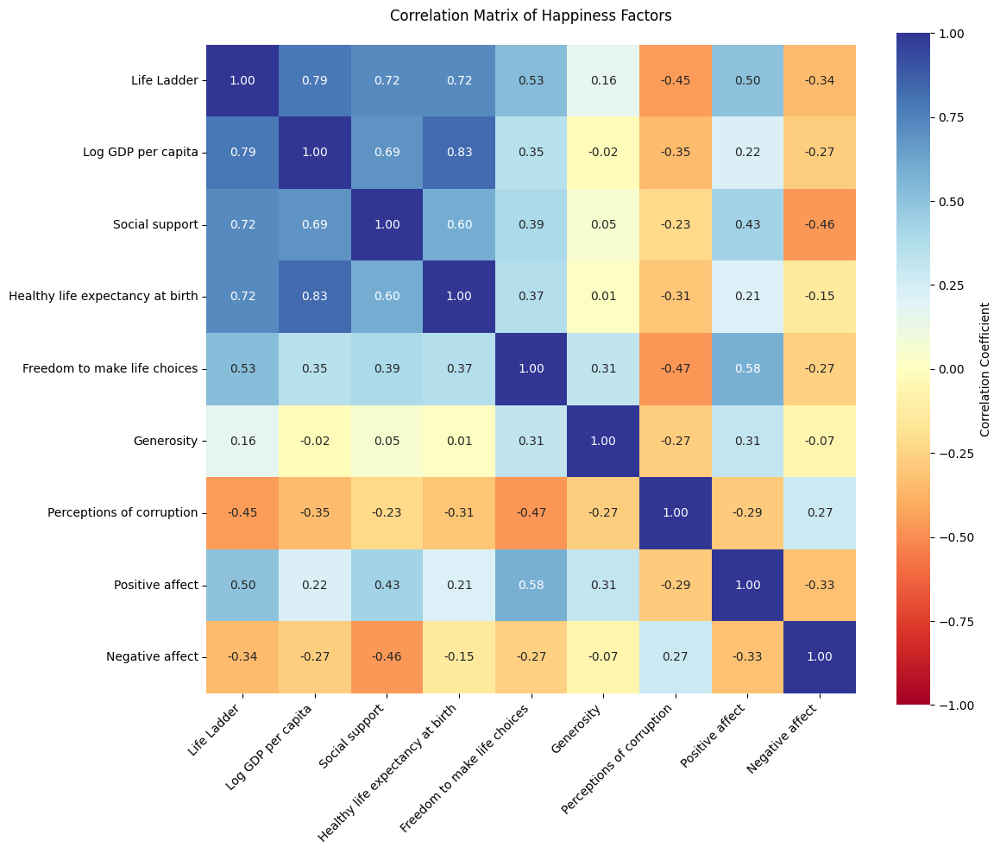

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def create_full_correlation_matrix(data):
    # Select relevant features
    features = ['Life Ladder', 'Log GDP per capita', 'Social support',
                'Healthy life expectancy at birth', 'Freedom to make life choices',
                'Generosity', 'Perceptions of corruption', 'Positive affect', 'Negative affect']

    # Calculate correlation matrix
    correlations = data[features].corr()

    # Create figure
    plt.figure(figsize=(12, 10))

    # Create heatmap
    sns.heatmap(correlations,
                annot=True,        # Show correlation values
                fmt='.2f',         # Round to 2 decimal places
                cmap='RdYlBu',     # Blue-Red diverging colormap
                center=0,          # Center the colormap at 0
                square=True,       # Make cells square
                vmin=-1,          # Minimum correlation value
                vmax=1,           # Maximum correlation value
                cbar_kws={'label': 'Correlation Coefficient'})

    plt.title('Correlation Matrix of Happiness Factors', pad=20)

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)

    plt.tight_layout()


create_full_correlation_matrix(normalized_data)
plt.show()

In [8]:

def select_features_correlation(df, target_column, correlation_threshold=0.2, plot_correlation=True):
    # Calculate correlation matrix
    features = ['Life Ladder', 'Log GDP per capita', 'Social support',
                'Healthy life expectancy at birth', 'Freedom to make life choices',
                'Generosity', 'Perceptions of corruption',"Positive affect","Negative affect"]

    correlation_matrix = df[features].corr()


    # Get correlation with target variable
    correlation_with_target = correlation_matrix[target_column].sort_values(ascending=False)
    print("\nCorrelation with target variable ({}):".format(target_column))
    print(correlation_with_target)

    # Remove target variable from features
    features = correlation_matrix.drop(target_column).columns

    # Initialize list of selected features
    selected_features = []
    # Iterate through correlations and select features based on threshold
    for feature in features:
        if abs(correlation_matrix.loc[target_column, feature]) >= correlation_threshold:
            selected_features.append(feature)
    return selected_features, correlation_with_target


# Select features
selected_features,correlation_with_target = select_features_correlation(normalized_data,target_column="Positive affect")

# Print selected features
print("\nSelected features:")
print(selected_features)


Correlation with target variable (Positive affect):
Positive affect                     1.000000
Freedom to make life choices        0.580693
Life Ladder                         0.501484
Social support                      0.425002
Generosity                          0.310120
Log GDP per capita                  0.222649
Healthy life expectancy at birth    0.212349
Perceptions of corruption          -0.287705
Negative affect                    -0.326562
Name: Positive affect, dtype: float64

Selected features:
['Life Ladder', 'Log GDP per capita', 'Social support', 'Healthy life expectancy at birth', 'Freedom to make life choices', 'Generosity', 'Perceptions of corruption', 'Positive affect', 'Negative affect']


In [9]:
# Creating new dataset after feature selection
data_new = normalized_data[selected_features]
data_new.head()

,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
0,-1.534075,-1.735050,-2.890446,-1.831162,-0.224818,1.014115,0.739800,0.414,0.258
1,-0.936210,-1.597095,-2.070783,-1.788127,-0.506967,1.156247,0.565624,0.481,0.237
2,-0.622287,-1.505993,-2.176284,-1.745091,-1.078499,0.729850,-0.212723,0.517,0.275
3,-1.438840,-1.534625,-2.322363,-1.702055,-1.830896,0.989396,-0.082091,0.480,0.267
4,-1.482049,-1.465214,-2.322363,-1.659020,-1.577686,1.446692,0.162843,0.614,0.268


# **Member 3: Week 1**
#### *Member 3: Model Research & Justification (20 hours total)*

*Day 1-2 (4 hours)*:
- *Model Research* (4 hours)
   - Research and identify machine learning models (Logistic Regression, Decision Trees, Random Forest, etc.) suitable for this dataset.

*Day 3-5 (4 hours)*:
- *Model Justification* (4 hours)
   - Justify model choices based on dataset characteristics and project goals (e.g., classification of medal winners).

*Day 6-7 (3 hours)*:
- *Initial Model Setup* (3 hours)
   - Set up the environment (libraries like Scikit-learn) and write initial code for model implementation. italicised text


---
# **Model Research**


For a comprehensive analysis, a mix of supervised and unsupervised learning models would be useful


**1)**  **Prediction** (Supervised Learning)

If the goal is to predict the "Life Ladder" (well-being/happiness levels) or another specific feature:
- Linear Regression or Decision Trees: For straightforward predictions of "Life Ladder" based on the other socioeconomic factors.
- Random Forests or Gradient Boosting: These are effective if nonlinear relationships exist and may improve prediction accuracy.
- Neural Networks: If the data is extensive, neural networks might capture complex relationships, though they require tuning.

For time-series predictions based on the year:
- ARIMA or LSTM (Long Short-Term Memory networks): For forecasting changes over time, such as how the "Life Ladder" might evolve given historical trends.

**2)** **Clustering** (Unsupervised Learning)
For grouping countries based on similar socioeconomic factors:
- K-Means or Hierarchical Clustering: Effective for creating clusters of countries with similar patterns in happiness and socioeconomic factors.
- DBSCAN: A density-based algorithm useful if clusters are irregularly shaped or if the dataset has noise.


**3)** **Exploratory Analysis** (Unsupervised Learning)
To explore relationships and dimensions:
- Principal Component Analysis (PCA): Useful for reducing dimensions and visualizing major patterns.
- t-SNE or UMAP: Good for visualizing high-dimensional relationships, especially if patterns exist within clusters or over time.



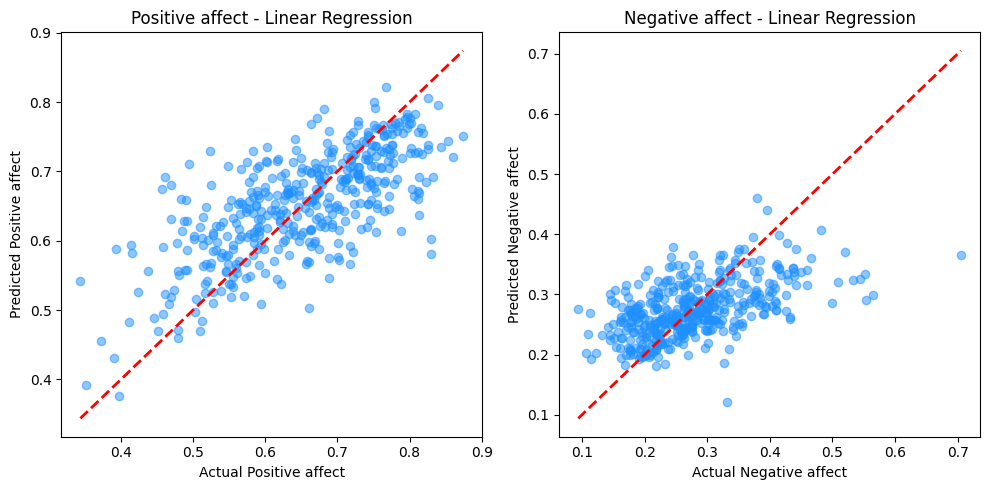

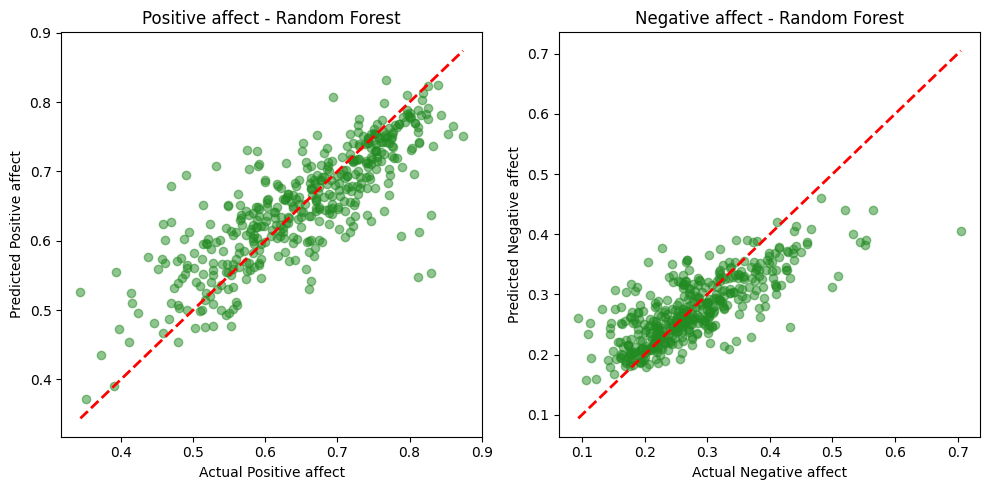

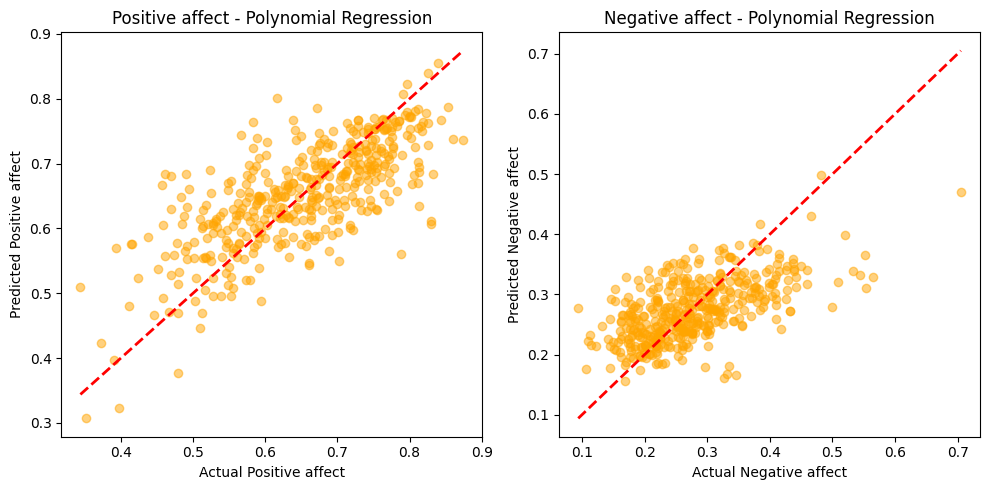

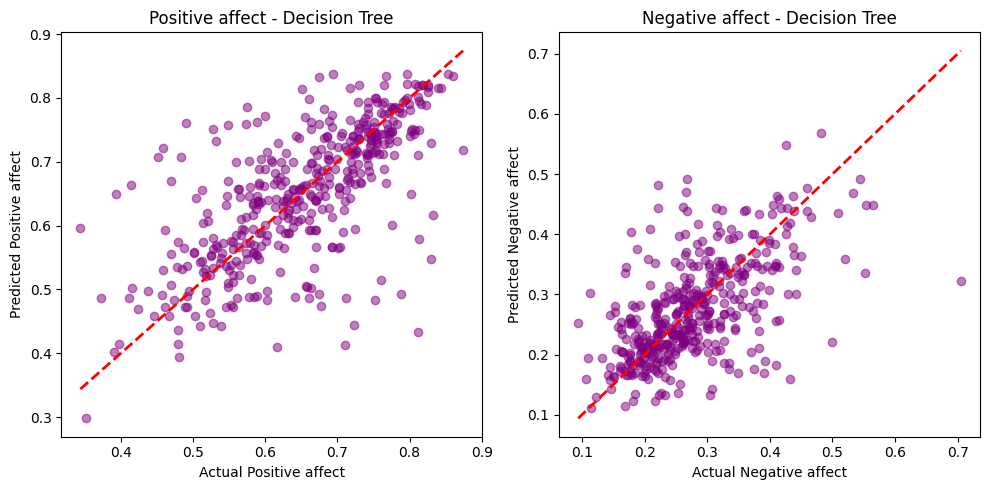

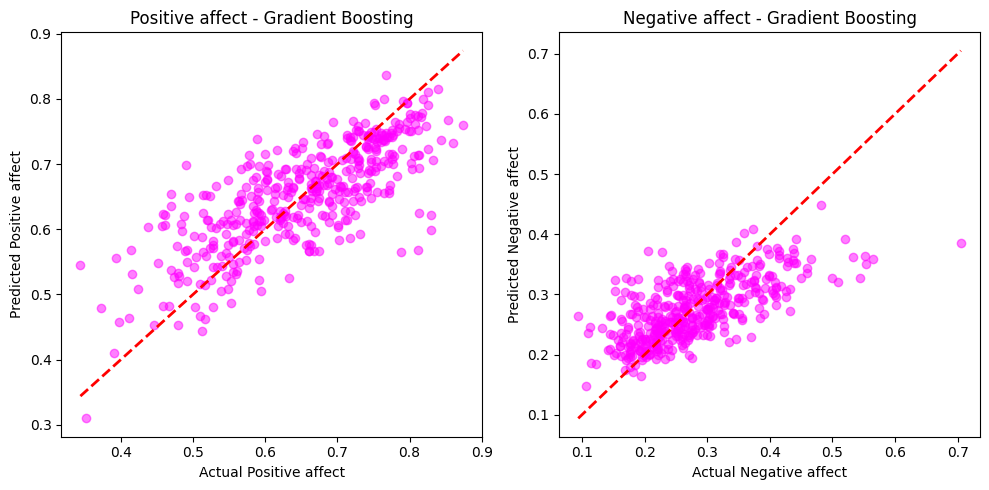

<ipython-input-10-149ab71a894c>:167: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_new[f'{target_feature}_Cluster'] = clusters


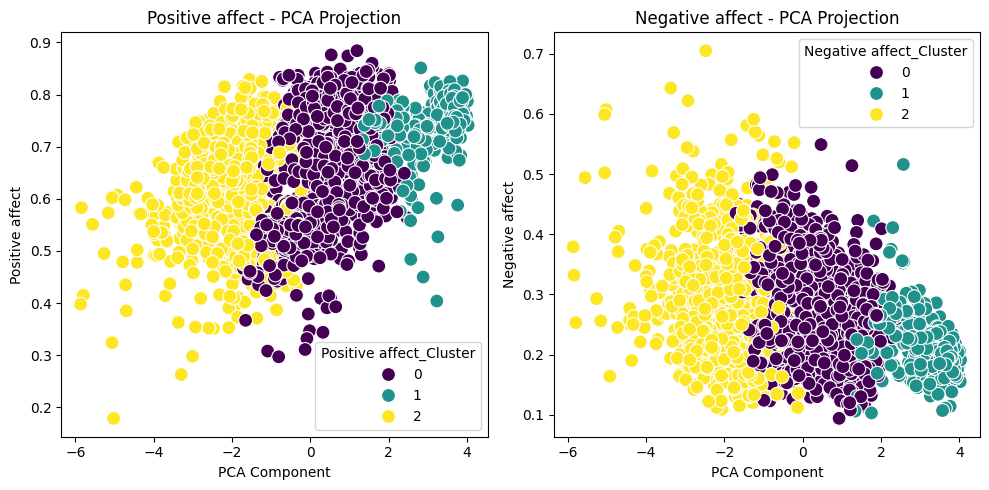

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from keras.models import Sequential
from keras.layers import Dense
# 'data_new' DataFrame is already loaded with relevant columns
# Feature list includes features used for predictions
feature_list = ['Life Ladder','Social support','Freedom to make life choices', 'Generosity', 'Log GDP per capita', 'Healthy life expectancy at birth', 'Perceptions of corruption']
target_columns = ['Positive affect', 'Negative affect']


# 1. Linear Regression Plots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # 2 rows, 3 columns

for i, target_feature in enumerate(target_columns):
    features = data_new[feature_list]  # Use all features except the current target
    target = data_new[target_feature]  # Set the target to the current feature

    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

    linear_reg = LinearRegression()
    linear_reg.fit(X_train, y_train)
    y_pred_lr = linear_reg.predict(X_test)

    # Linear Regression Plot
    ax = axes[i]  # Get the current subplot

    ax.scatter(y_test, y_pred_lr, alpha=0.5, color="dodgerblue")
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)
    ax.set_xlabel(f"Actual {target_feature}")
    ax.set_ylabel(f"Predicted {target_feature}")
    ax.set_title(f"{target_feature} - Linear Regression")

plt.tight_layout()
plt.show()

# 2. Random Forest Plots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # 1 rows, 2 columns

for i, target_feature in enumerate(target_columns):
    features = data_new[feature_list]  # Use all features except the current target
    target = data_new[target_feature]  # Set the target to the current feature

    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

    random_forest = RandomForestRegressor(random_state=42)
    random_forest.fit(X_train, y_train)
    y_pred_rf = random_forest.predict(X_test)

    # Random Forest Plot
    ax = axes[i]  # Get the current subplot

    ax.scatter(y_test, y_pred_rf, alpha=0.5, color="forestgreen")
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)
    ax.set_xlabel(f"Actual {target_feature}")
    ax.set_ylabel(f"Predicted {target_feature}")
    ax.set_title(f"{target_feature} - Random Forest")

plt.tight_layout()
plt.show()

# 3. Polynomial Regression Plots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # 2 rows, 3 columns

for i, target_feature in enumerate(target_columns):
    features = data_new[feature_list]  # Use all features except the current target
    target = data_new[target_feature]  # Set the target to the current feature

    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

    # Create polynomial features
    poly = PolynomialFeatures(degree=2)  # Change the degree as necessary
    X_poly_train = poly.fit_transform(X_train)
    X_poly_test = poly.transform(X_test)

    poly_reg = LinearRegression()
    poly_reg.fit(X_poly_train, y_train)
    y_pred_poly = poly_reg.predict(X_poly_test)

    # Polynomial Regression Plot
    ax = axes[i]  # Get the current subplot


    # Instead of using sorted_indices directly, use it to sort y_test values:
    sorted_y_test = np.sort(y_test)

    # Then plot using sorted_y_test and the corresponding predictions:
    ax.scatter(sorted_y_test, y_pred_poly[np.argsort(y_test)], alpha=0.5, color="orange")

    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)
    ax.set_xlabel(f"Actual {target_feature}")
    ax.set_ylabel(f"Predicted {target_feature}")
    ax.set_title(f"{target_feature} - Polynomial Regression")

plt.tight_layout()
plt.show()

# 4. Decision Tree Regression Plots
fig, axes = plt.subplots(1,2, figsize=(10, 5))  # 2 rows, 3 columns

for i, target_feature in enumerate(target_columns):
    features = data_new[feature_list]  # Use all features except the current target
    target = data_new[target_feature]  # Set the target to the current feature

    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

    decision_tree = DecisionTreeRegressor(random_state=42)
    decision_tree.fit(X_train, y_train)
    y_pred_dt = decision_tree.predict(X_test)

    # Decision Tree Plot
    ax = axes[i]  # Get the current subplot

    ax.scatter(y_test, y_pred_dt, alpha=0.5, color="purple")
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)
    ax.set_xlabel(f"Actual {target_feature}")
    ax.set_ylabel(f"Predicted {target_feature}")
    ax.set_title(f"{target_feature} - Decision Tree")

plt.tight_layout()
plt.show()

# 5. Gradient Boosting Regression Plots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # 2 rows, 3 columns

for i, target_feature in enumerate(target_columns):
    features = data_new[feature_list]  # Use all features except the current target
    target = data_new[target_feature]  # Set the target to the current feature

    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

    # Gradient Boosting model
    gb_model = GradientBoostingRegressor(random_state=42)
    gb_model.fit(X_train, y_train)
    y_pred_gb = gb_model.predict(X_test)

    # Gradient Boosting Plot
    ax = axes[i]  # Get the current subplot

    ax.scatter(y_test, y_pred_gb, alpha=0.5, color="magenta")
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)
    ax.set_xlabel(f"Actual {target_feature}")
    ax.set_ylabel(f"Predicted {target_feature}")
    ax.set_title(f"{target_feature} - Gradient Boosting")

plt.tight_layout()
plt.show()


# 7. PCA Results
fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # 2 rows, 3 columns

for i, target_feature in enumerate(target_columns):
    features = data_new[feature_list]  # Use all features except the current target

    # Applying K-Means clustering
    kmeans = KMeans(n_clusters=3, random_state=42)
    clusters = kmeans.fit_predict(features)
    data_new[f'{target_feature}_Cluster'] = clusters

    # Applying PCA for dimensionality reduction
    pca = PCA(n_components=1)
    pca_component = pca.fit_transform(features)
    data_new[f'{target_feature}_PCA'] = pca_component[:, 0]

    # Plotting PCA results

    # Use axes[row, col] to access the correct subplot
    ax = axes[i]
    sns.scatterplot(x=f'{target_feature}_PCA', y=target_feature, hue=f'{target_feature}_Cluster', data=data_new, palette='viridis', s=100, ax=ax)
    ax.set_title(f"{target_feature} - PCA Projection")
    ax.set_xlabel("PCA Component")
    ax.set_ylabel(target_feature)

plt.tight_layout()
plt.show()


## **Member 3 : Week 2 : Model Implementation**

*Day 1-4 (8 hours)*:
- *Model Implementation* (6 hours)
   - Implement machine learning models (Logistic Regression, Decision Trees, Random Forest, etc.).
- *Hyperparameter Tuning* (2 hours)
   - Begin tuning hyperparameters using techniques like grid search or random search.

*Day 5-7 (4 hours)*:
- *Cross-Validation & Testing* (4 hours)
   - Apply cross-validation and test models on the test set. Document results.




/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,



Metrics for Positive affect:
--------------------------------------------------

Linear Regression:
MAE: 0.0581
RMSE: 0.0749
R² Score: 0.4977
Accuracy (within 15%): 80.00%

Random Forest:
MAE: 0.0448
RMSE: 0.0614
R² Score: 0.6625
Accuracy (within 15%): 89.18%

Decision Tree:
MAE: 0.0570
RMSE: 0.0816
R² Score: 0.4047
Accuracy (within 15%): 80.94%

Gradient Boosting:
MAE: 0.0478
RMSE: 0.0641
R² Score: 0.6322
Accuracy (within 15%): 88.94%

Polynomial Regression:
MAE: 0.0565
RMSE: 0.0730
R² Score: 0.5233
Accuracy (within 15%): 80.00%

Metrics for Negative affect:
--------------------------------------------------

Linear Regression:
MAE: 0.0557
RMSE: 0.0735
R² Score: 0.2937
Accuracy (within 15%): 48.71%

Random Forest:
MAE: 0.0421
RMSE: 0.0574
R² Score: 0.5697
Accuracy (within 15%): 62.35%

Decision Tree:
MAE: 0.0524
RMSE: 0.0717
R² Score: 0.3271
Accuracy (within 15%): 51.29%

Gradient Boosting:
MAE: 0.0450
RMSE: 0.0603
R² Score: 0.5242
Accuracy (within 15%): 59.29%

Polynomial Regression

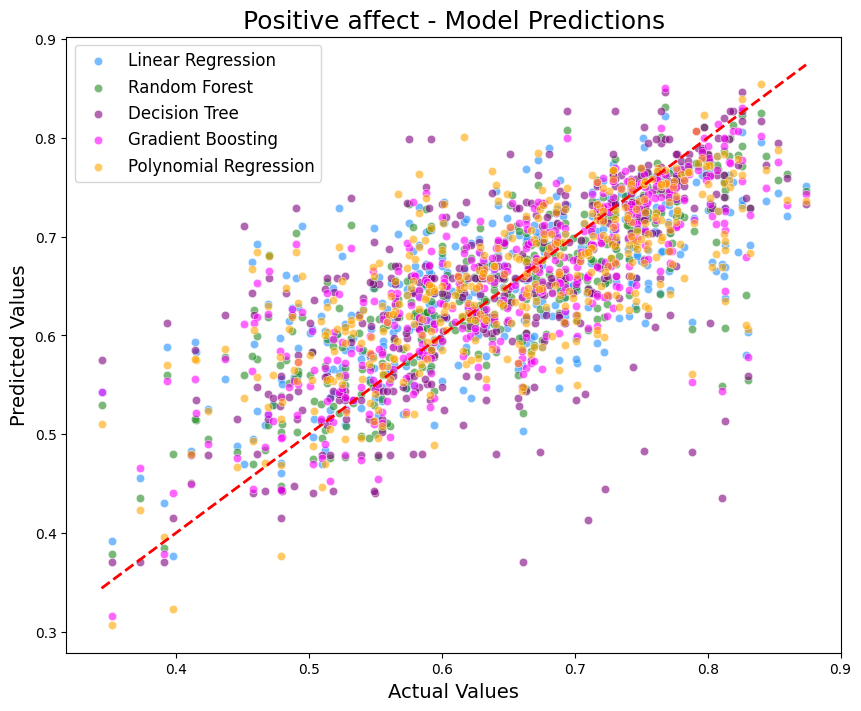

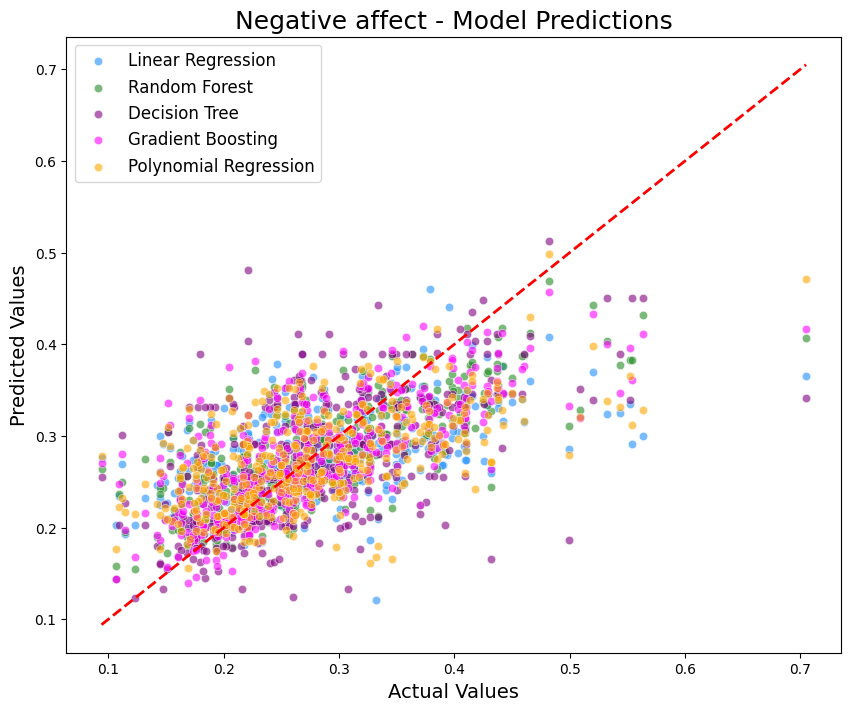

In [11]:
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Hyperparameter grids for each model
param_grids = {
    'RandomForestRegressor': {
        'n_estimators': [50, 100, 150],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10]
    },
    'DecisionTreeRegressor': {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10]
    },
    'GradientBoostingRegressor': {
        'n_estimators': [50, 100, 150],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 10]
    }
}

def calculate_metrics(y_true, y_pred):
    """Calculate various regression metrics"""
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    # Calculate accuracy within 15% tolerance
    tolerance = 0.15
    within_tolerance = np.abs(y_true - y_pred) <= (tolerance * np.abs(y_true))
    accuracy = np.mean(within_tolerance)

    return mae, rmse, r2, accuracy

# Loop for each feature to perform hyperparameter tuning and plot
results = {}
metrics_results = {}

for i, target_feature in enumerate(target_columns):
    features = data_new[feature_list]
    target = data_new[target_feature]

    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

    # Dictionary to store metrics for current feature
    feature_metrics = {}

    # Linear Regression
    linear_reg = LinearRegression()
    linear_reg.fit(X_train, y_train)
    y_pred_lr = linear_reg.predict(X_test)
    feature_metrics['Linear Regression'] = calculate_metrics(y_test, y_pred_lr)

    # Random Forest with RandomizedSearchCV
    rf = RandomForestRegressor(random_state=42)
    rf_search = RandomizedSearchCV(rf, param_grids['RandomForestRegressor'], n_iter=10, cv=3, random_state=42)
    rf_search.fit(X_train, y_train)
    y_pred_rf = rf_search.best_estimator_.predict(X_test)
    feature_metrics['Random Forest'] = calculate_metrics(y_test, y_pred_rf)

    # Decision Tree with RandomizedSearchCV
    dt = DecisionTreeRegressor(random_state=42)
    dt_search = RandomizedSearchCV(dt, param_grids['DecisionTreeRegressor'], n_iter=10, cv=3, random_state=42)
    dt_search.fit(X_train, y_train)
    y_pred_dt = dt_search.best_estimator_.predict(X_test)
    feature_metrics['Decision Tree'] = calculate_metrics(y_test, y_pred_dt)

    # Gradient Boosting with RandomizedSearchCV
    gb = GradientBoostingRegressor(random_state=42)
    gb_search = RandomizedSearchCV(gb, param_grids['GradientBoostingRegressor'], n_iter=10, cv=3, random_state=42)
    gb_search.fit(X_train, y_train)
    y_pred_gb = gb_search.best_estimator_.predict(X_test)
    feature_metrics['Gradient Boosting'] = calculate_metrics(y_test, y_pred_gb)

    # Polynomial Regression with PolynomialFeatures
    poly = PolynomialFeatures(degree=2)
    X_poly_train = poly.fit_transform(X_train)
    X_poly_test = poly.transform(X_test)
    poly_reg = LinearRegression()
    poly_reg.fit(X_poly_train, y_train)
    y_pred_poly = poly_reg.predict(X_poly_test)
    feature_metrics['Polynomial Regression'] = calculate_metrics(y_test, y_pred_poly)

    # Store predictions for plotting
    results[target_feature] = {
        'Actual': y_test,
        'Linear Regression': y_pred_lr,
        'Random Forest': y_pred_rf,
        'Decision Tree': y_pred_dt,
        'Gradient Boosting': y_pred_gb,
        'Polynomial Regression': y_pred_poly
    }

    # Store metrics
    metrics_results[target_feature] = feature_metrics

    # Print metrics for current feature
    print(f"\nMetrics for {target_feature}:")
    print("-" * 50)
    for model, metrics in feature_metrics.items():
        print(f"\n{model}:")
        print(f"MAE: {metrics[0]:.4f}")
        print(f"RMSE: {metrics[1]:.4f}")
        print(f"R² Score: {metrics[2]:.4f}")
        print(f"Accuracy (within 15%): {metrics[3]*100:.2f}%")

# Plotting
for feature, predictions in results.items():
    df = pd.DataFrame(predictions)

    plt.figure(figsize=(10, 8))

    # Plot each model's predictions against the actual values
    sns.scatterplot(data=df, x='Actual', y='Linear Regression', color="dodgerblue", label="Linear Regression", alpha=0.6)
    sns.scatterplot(data=df, x='Actual', y='Random Forest', color="forestgreen", label="Random Forest", alpha=0.6)
    sns.scatterplot(data=df, x='Actual', y='Decision Tree', color="purple", label="Decision Tree", alpha=0.6)
    sns.scatterplot(data=df, x='Actual', y='Gradient Boosting', color="magenta", label="Gradient Boosting", alpha=0.6)
    sns.scatterplot(data=df, x='Actual', y='Polynomial Regression', color="orange", label="Polynomial Regression", alpha=0.6)

    # Reference line for perfect predictions
    plt.plot([df['Actual'].min(), df['Actual'].max()], [df['Actual'].min(), df['Actual'].max()], 'r--', linewidth=2)

    # Titles and labels
    plt.title(f"{feature} - Model Predictions", fontsize=18)
    plt.xlabel("Actual Values", fontsize=14)
    plt.ylabel("Predicted Values", fontsize=14)
    plt.legend(fontsize=12, loc='upper left')

    plt.show()

Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Fitting 3 folds for each of 1 candidates, totalling 3 fits


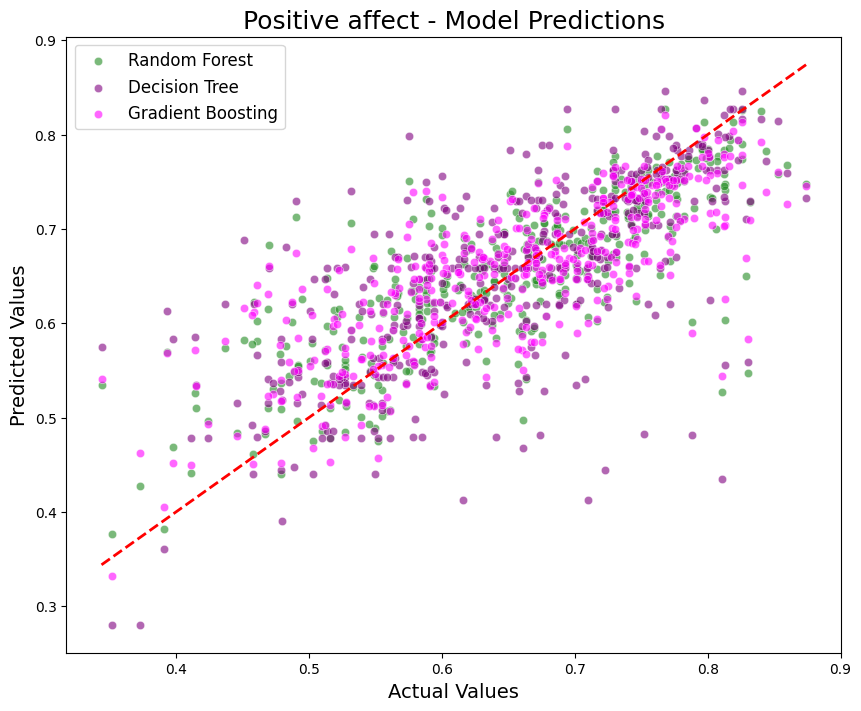

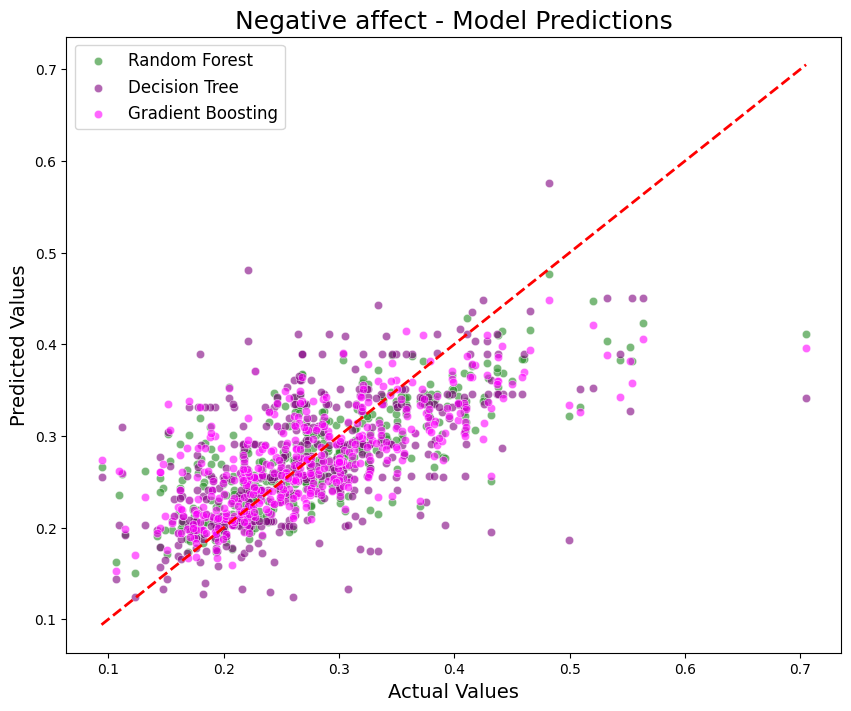

In [12]:
!pip install pandas scikit-learn matplotlib seaborn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.metrics import mean_squared_error


results = {}
for i, target_feature in enumerate(target_columns):
    # Select only numerical features for training and drop the target feature:
    numerical_features = data_new[feature_list].select_dtypes(include=np.number)
    features = numerical_features # Use only numerical features
    target = data_new[target_feature]

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

param_grid_rf = {
    'n_estimators': [50],       # Reduced options
    'max_depth': [None, 10],
    'min_samples_split': [5]    # Single value to reduce combinations
}

param_grid_gb = {
    'n_estimators': [50],
    'learning_rate': [0.1],     # Single value to simplify search
    'max_depth': [3, 5]
}

param_grid_dt = {
    'max_depth': [10],          # Reduced to single depth level
    'min_samples_split': [5]
}

# Adjusted model dictionary with reduced grid sizes and CV folds
models = {
    'Random Forest': (RandomForestRegressor(random_state=42), param_grid_rf),
    'Gradient Boosting': (GradientBoostingRegressor(random_state=42), param_grid_gb),
    'Decision Tree': (DecisionTreeRegressor(random_state=42), param_grid_dt)
}

for target_feature in target_columns:
    # Select only numerical features for training and drop the target feature:
    numerical_features = data_new[feature_list].select_dtypes(include=np.number).drop(columns=[target_feature], errors='ignore')

    # Use only numerical features for X
    X = numerical_features
    y = data_new[target_feature]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    predictions = {'Actual': y_test}

    for model_name, (model, param_grid) in models.items():
        grid_search = GridSearchCV(estimator=model, param_grid=param_grid,
                                   scoring='neg_mean_squared_error', cv=3, n_jobs=-1, verbose=1)  # 3-fold CV
        grid_search.fit(X_train, y_train)  # Now fitting with only numerical features

        best_model = grid_search.best_estimator_
        y_pred = best_model.predict(X_test)
        predictions[model_name] = y_pred

    results[target_feature] = predictions

# Visualization (same as before)
for feature, predictions in results.items():
    df = pd.DataFrame(predictions)
    plt.figure(figsize=(10, 8))
    sns.scatterplot(data=df, x='Actual', y='Random Forest', color="forestgreen", label="Random Forest", alpha=0.6)
    sns.scatterplot(data=df, x='Actual', y='Decision Tree', color="purple", label="Decision Tree", alpha=0.6)
    sns.scatterplot(data=df, x='Actual', y='Gradient Boosting', color="magenta", label="Gradient Boosting", alpha=0.6)
    plt.plot([df['Actual'].min(), df['Actual'].max()], [df['Actual'].min(), df['Actual'].max()], 'r--', linewidth=2)
    plt.title(f"{feature} - Model Predictions", fontsize=18)
    plt.xlabel("Actual Values", fontsize=14)
    plt.ylabel("Predicted Values", fontsize=14)
    plt.legend(fontsize=12, loc='upper left')
    plt.show()


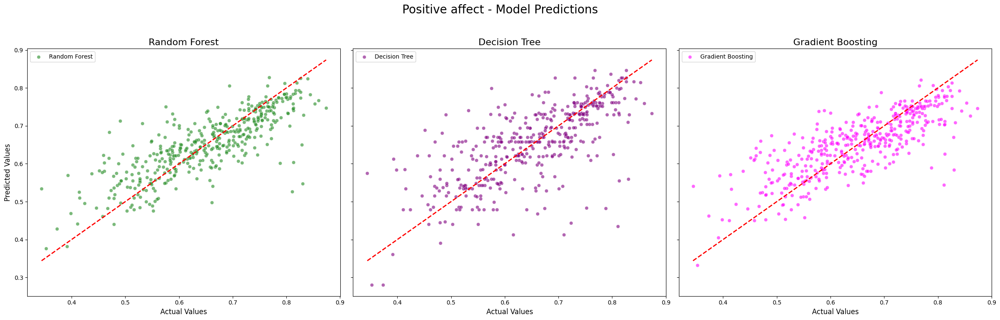

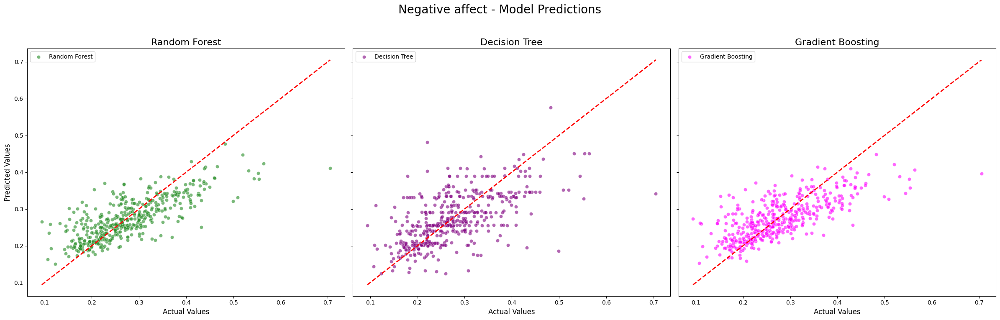

In [13]:
# Visualization with grid layout for each model per target feature
for feature, predictions in results.items():
    df = pd.DataFrame(predictions)

    # Create a 1x3 grid layout for Random Forest, Decision Tree, and Gradient Boosting
    fig, axes = plt.subplots(1, 3, figsize=(24, 8), sharex=True, sharey=True)
    fig.suptitle(f"{feature} - Model Predictions", fontsize=20)

    # Plot Random Forest predictions
    sns.scatterplot(data=df, x='Actual', y='Random Forest', color="forestgreen", label="Random Forest", alpha=0.6, ax=axes[0])
    axes[0].plot([df['Actual'].min(), df['Actual'].max()], [df['Actual'].min(), df['Actual'].max()], 'r--', linewidth=2)
    axes[0].set_title("Random Forest", fontsize=16)
    axes[0].set_xlabel("Actual Values", fontsize=12)
    axes[0].set_ylabel("Predicted Values", fontsize=12)

    # Plot Decision Tree predictions
    sns.scatterplot(data=df, x='Actual', y='Decision Tree', color="purple", label="Decision Tree", alpha=0.6, ax=axes[1])
    axes[1].plot([df['Actual'].min(), df['Actual'].max()], [df['Actual'].min(), df['Actual'].max()], 'r--', linewidth=2)
    axes[1].set_title("Decision Tree", fontsize=16)
    axes[1].set_xlabel("Actual Values", fontsize=12)

    # Plot Gradient Boosting predictions
    sns.scatterplot(data=df, x='Actual', y='Gradient Boosting', color="magenta", label="Gradient Boosting", alpha=0.6, ax=axes[2])
    axes[2].plot([df['Actual'].min(), df['Actual'].max()], [df['Actual'].min(), df['Actual'].max()], 'r--', linewidth=2)
    axes[2].set_title("Gradient Boosting", fontsize=16)
    axes[2].set_xlabel("Actual Values", fontsize=12)

    # Adjust layout and show the plot
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Leave space for the main title
    plt.show()


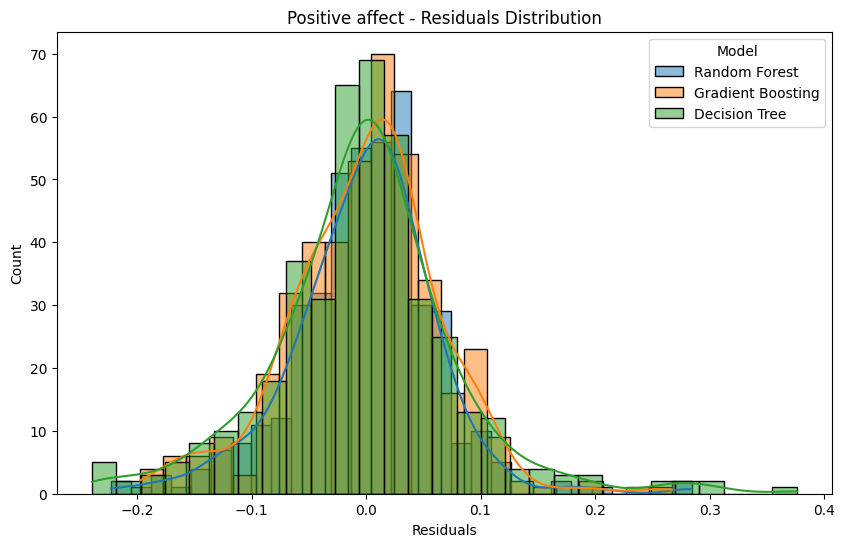

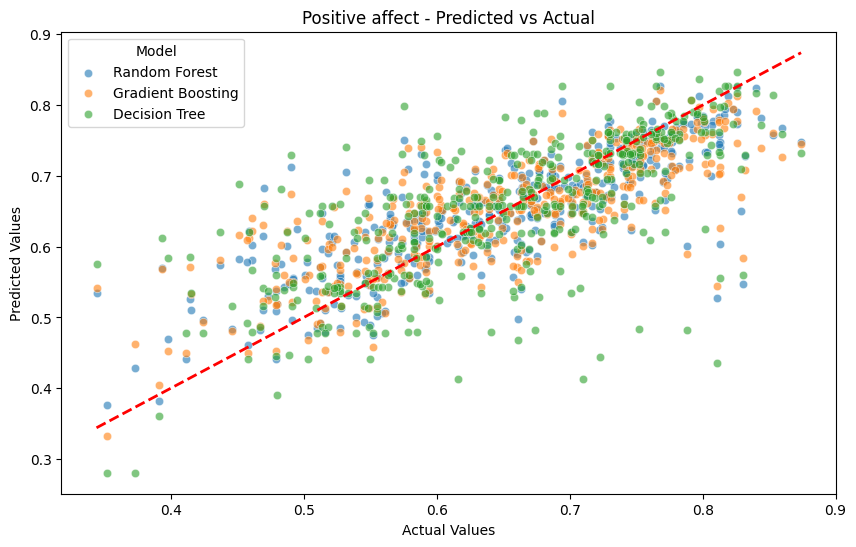

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
<ipython-input-14-180866a4097e>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

 

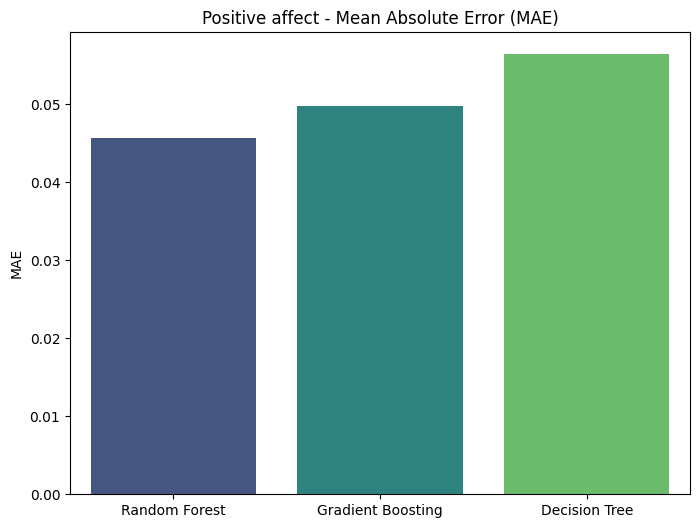

<ipython-input-14-180866a4097e>:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(model_errors.keys()), y=[err['RMSE'] for err in model_errors.values()], palette='magma')


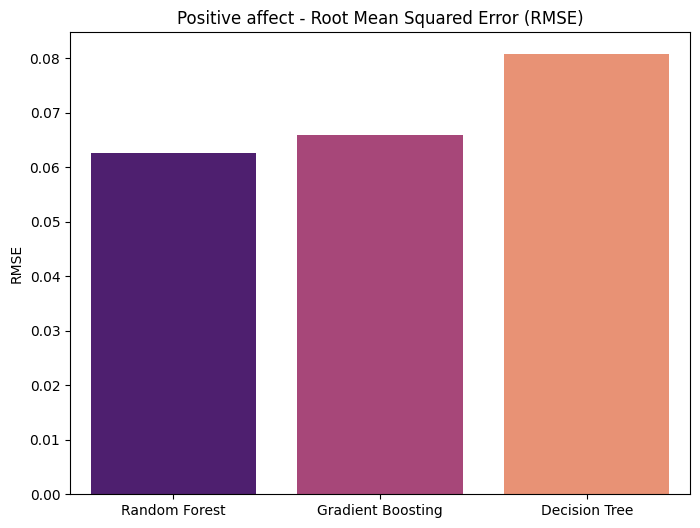

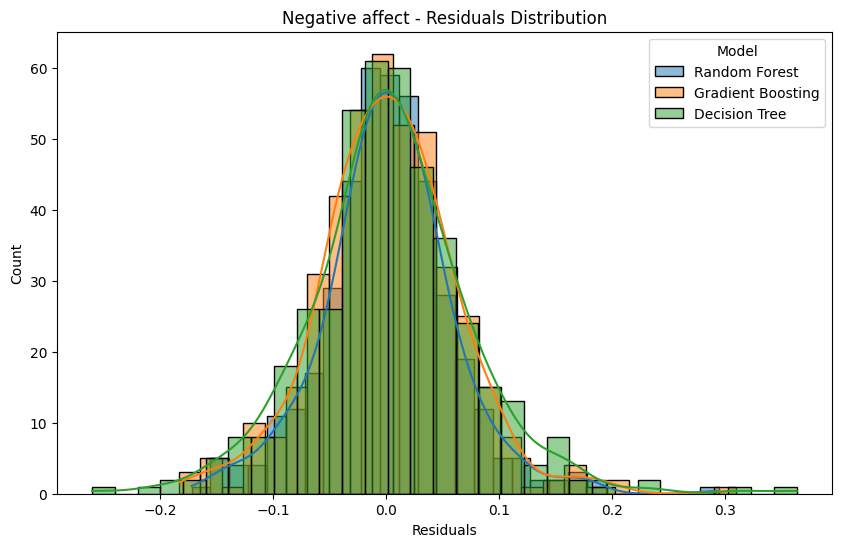

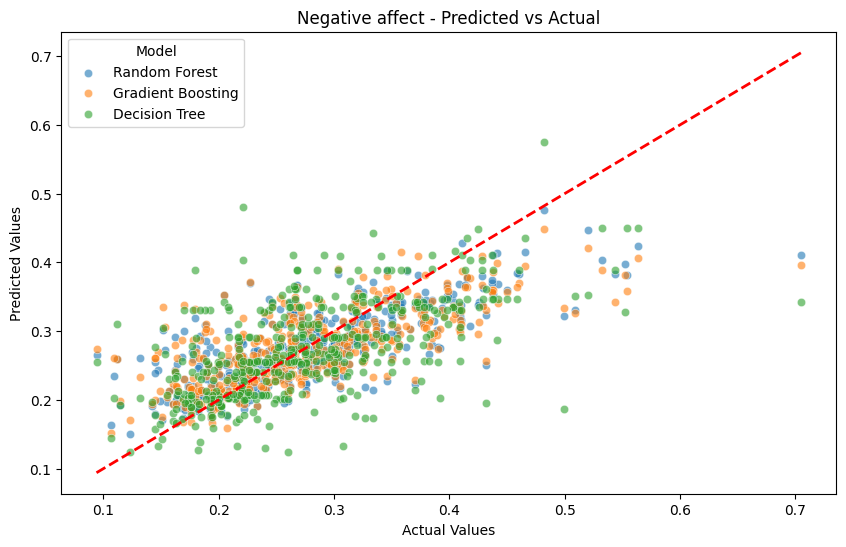

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
<ipython-input-14-180866a4097e>:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

 

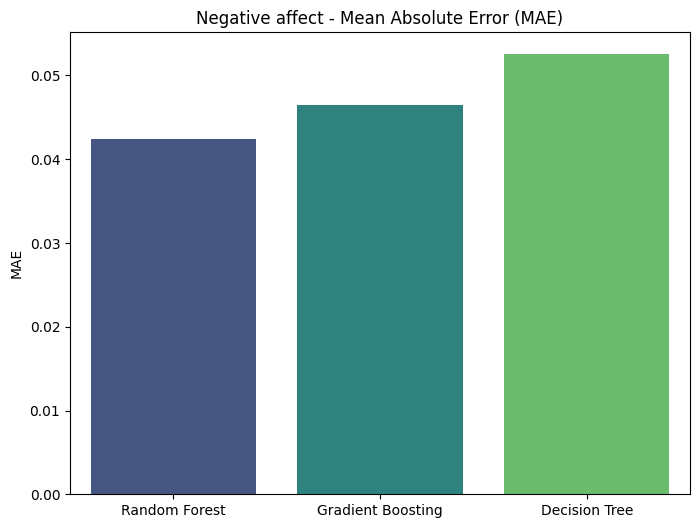

<ipython-input-14-180866a4097e>:57: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(model_errors.keys()), y=[err['RMSE'] for err in model_errors.values()], palette='magma')


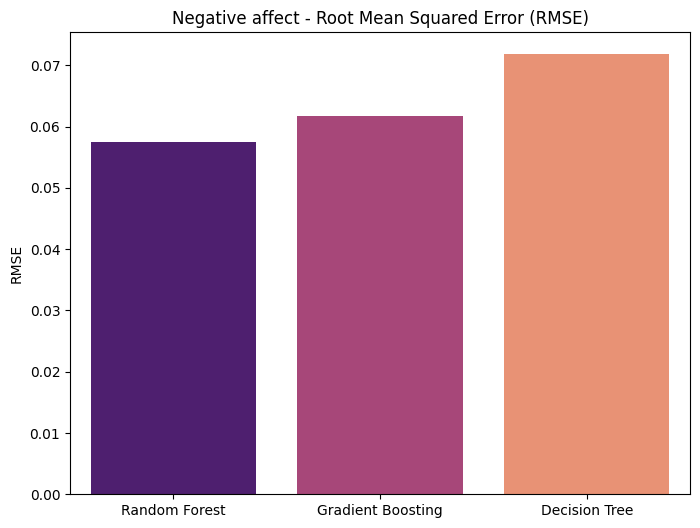

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Create dictionaries to store metrics for each target and model
performance_metrics = {}

# Evaluate each model's performance for each target feature
for feature, predictions in results.items():
    # Convert predictions dictionary to DataFrame for easy plotting
    df = pd.DataFrame(predictions)
    y_true = df['Actual']

    performance_metrics[feature] = {}  # Store metrics by feature

    # Residuals (errors)
    residuals = {model_name: df['Actual'] - df[model_name] for model_name in predictions.keys() if model_name != 'Actual'}

    # 1. Separate Residuals Distribution Plot
    plt.figure(figsize=(10, 6))
    for model_name, res in residuals.items():
        sns.histplot(res, kde=True, label=model_name, alpha=0.5)
    plt.title(f"{feature} - Residuals Distribution")
    plt.xlabel("Residuals")
    plt.legend(title='Model')
    plt.show()

    # 2. Separate Predicted vs. Actual Plot
    plt.figure(figsize=(10, 6))
    for model_name in [col for col in df.columns if col != 'Actual']:
        sns.scatterplot(x=y_true, y=df[model_name], label=model_name, alpha=0.6)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', linewidth=2)  # Perfect prediction line
    plt.title(f"{feature} - Predicted vs Actual")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.legend(title='Model')
    plt.show()

    # 3. Separate Mean Absolute Error (MAE) Bar Plot
    model_errors = {}
    for model_name in residuals.keys():
        mae = mean_absolute_error(y_true, df[model_name])
        rmse = mean_squared_error(y_true, df[model_name], squared=False)
        model_errors[model_name] = {'MAE': mae, 'RMSE': rmse}

        # Store metrics
        performance_metrics[feature][model_name] = model_errors[model_name]

    plt.figure(figsize=(8, 6))
    sns.barplot(x=list(model_errors.keys()), y=[err['MAE'] for err in model_errors.values()], palette='viridis')
    plt.title(f"{feature} - Mean Absolute Error (MAE)")
    plt.ylabel("MAE")
    plt.show()

    # 4. Separate Root Mean Squared Error (RMSE) Bar Plot
    plt.figure(figsize=(8, 6))
    sns.barplot(x=list(model_errors.keys()), y=[err['RMSE'] for err in model_errors.values()], palette='magma')
    plt.title(f"{feature} - Root Mean Squared Error (RMSE)")
    plt.ylabel("RMSE")
    plt.show()


Member 3 ( Kalhan)
Worked on code for taking input and using random forest and predicting positive affect and negative affect.

Done with final changes.

In [15]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, f1_score


# Define feature columns and target columns
features = ['Life Ladder', 'Log GDP per capita', 'Social support', 'Healthy life expectancy at birth', 'Freedom to make life choices', 'Generosity' , 'Perceptions of corruption']
targets = ['Positive affect', 'Negative affect']  # Multi-target for both Positive and Negative affect

# Split data for training and testing
X = data_new[features]
y = data_new[targets]  # Selecting both targets as the output for the model
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Random Forest model for multi-target regression and performing Hyperparameter tuning
model = RandomForestRegressor(n_estimators=500, random_state=42, max_depth=19, max_features=None)
model.fit(X_train, y_train)
# Predict on the test set
y_pred = model.predict(X_test)


# Calculate RMSE and R-squared for each target
rmse_positive = np.sqrt(mean_squared_error(y_test['Positive affect'], y_pred[:, 0]))
rmse_negative = np.sqrt(mean_squared_error(y_test['Negative affect'], y_pred[:, 1]))
r2_positive = r2_score(y_test['Positive affect'], y_pred[:, 0])
r2_negative = r2_score(y_test['Negative affect'], y_pred[:, 1])
tolerance = 0.15

# Calculate custom accuracy within tolerance
accuracy_positive = np.mean(np.abs((y_pred[:, 0] - y_test['Positive affect']) / y_test['Positive affect']) <= tolerance)
accuracy_negative = np.mean(np.abs((y_pred[:, 1] - y_test['Negative affect']) / y_test['Negative affect']) <= tolerance)

print("Positive Affect - RMSE:", rmse_positive)
print("Positive Affect - R²:", r2_positive)
print("Positive Affect - Accuracy within 15%:", accuracy_positive)

print("Negative Affect - RMSE:", rmse_negative)
print("Negative Affect - R²:", r2_negative)
print("Negative Affect - Accuracy within 15%:", accuracy_negative)

# Function to get predictions based on user input
def predict_happiness():
    print("Please enter the following values:")

    # Input prompts for each feature
    life_ladder = float(input("Life Ladder (scale 0-10): "))
    freedom = float(input("Freedom to make life choices (scale 0-1): "))
    generosity = float(input("Generosity (scale 0-1): "))
    support = float(input("Social support (scale 0-1): "))
    gdp = float(input("Log GDP per capita: "))
    life_expectancy = float(input("Healthy life expectancy at birth: "))
    corruption = float(input("Perceptions of corruption: "))

    # Prepare the input for prediction
    input_data = pd.DataFrame([[life_ladder, gdp, support, life_expectancy, freedom, generosity, corruption]],
                              columns=features)

    # Scale the input data using the fitted scaler
    input_data_scaled = scaler.transform(input_data)

    # Predict using the trained model
    positive_affect, negative_affect = model.predict(input_data_scaled)[0]

    # Output positive and negative affects
    print(f"Predicted Positive Affect: {positive_affect:.2f}")
    print(f"Predicted Negative Affect: {negative_affect:.2f}")

# Call the prediction function
predict_happiness()


Positive Affect - RMSE: 0.06007081819550938
Positive Affect - R²: 0.6772639054016425
Positive Affect - Accuracy within 15%: 0.8847058823529412
Negative Affect - RMSE: 0.0587924266954097
Negative Affect - R²: 0.5479030874034405
Negative Affect - Accuracy within 15%: 0.6
Please enter the following values:
Life Ladder (scale 0-10): 4.220
Freedom to make life choices (scale 0-1): 0.523
Generosity (scale 0-1): 0.040
Social support (scale 0-1): 0.559
Log GDP per capita: 7.650
Healthy life expectancy at birth: 52.925
Perceptions of corruption: 0.793
Predicted Positive Affect: 0.52
Predicted Negative Affect: 0.34


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
